In [63]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image
from sklearn.metrics import roc_auc_score
from sklearn.preprocessing import label_binarize
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

In [64]:
swin_baseline = pd.read_csv('./swin_baseline.csv')
swin_base_2class = pd.read_csv('./swin_base_2class.csv')
test_val = pd.read_csv('./test_val.csv')

test_val['image'] = test_val['image'].str.split('.').str[0]

In [65]:
swin_baseline = swin_baseline.set_index('ID_img').join(swin_base_2class.set_index('ID_img')['class'], rsuffix='2cl')
swin_baseline = swin_baseline.join(test_val.set_index('image')['class'], rsuffix='_t')
swin_baseline['class2cl'] = swin_baseline['class2cl'].replace({1:2})
swin_baseline.head(5)

,class,class2cl,class_t
ID_img,,,
10942248620_77738287904_92317579456_8,2,2,2
11476252728_90946703888_83373466997_4,1,0,1
11758169966_65799840524_72283028069_1,1,0,1
12054928568_20130374464_8647095983_8,1,0,1
12219465515_74065178154_47483019939_5,1,0,1


In [66]:
swin_baseline['class_t_2'] = swin_baseline['class_t']
swin_baseline['class_t_2'] = swin_baseline['class_t_2'].replace({1:0})

In [67]:
real = swin_baseline['class_t']
pred = swin_baseline['class']
print('roc auc', roc_auc_score(label_binarize(real, classes=[0,1,2]), label_binarize(pred, classes=[0,1,2]), multi_class='ovo'))

roc auc 0.8886390710624174


<AxesSubplot:>

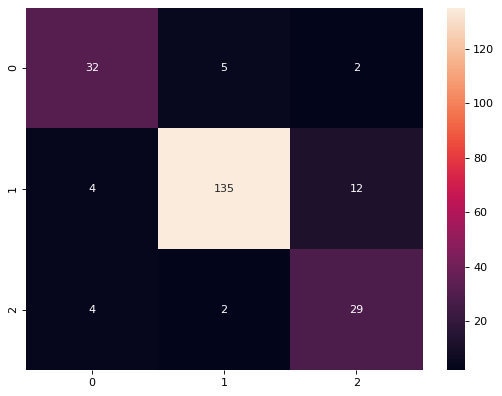

In [68]:
matrix = confusion_matrix(real, pred)
matrix.diagonal()/matrix.sum(axis=0)

plt.figure(figsize=(8, 6), dpi=80)
sns.heatmap(matrix, annot=True, fmt='d')

In [69]:
print(swin_baseline['class_t'].value_counts())
print(swin_baseline['class'].value_counts())

1    151
0     39
2     35
Name: class_t, dtype: int64
1    142
2     43
0     40
Name: class, dtype: int64


In [70]:
print(swin_baseline['class_t_2'].value_counts())
print(swin_baseline['class2cl'].value_counts())

0    190
2     35
Name: class_t_2, dtype: int64
0    199
2     26
Name: class2cl, dtype: int64


In [71]:
print(classification_report(swin_baseline['class_t'], swin_baseline['class']))

              precision    recall  f1-score   support

           0       0.80      0.82      0.81        39
           1       0.95      0.89      0.92       151
           2       0.67      0.83      0.74        35

    accuracy                           0.87       225
   macro avg       0.81      0.85      0.83       225
weighted avg       0.88      0.87      0.87       225



<AxesSubplot:>

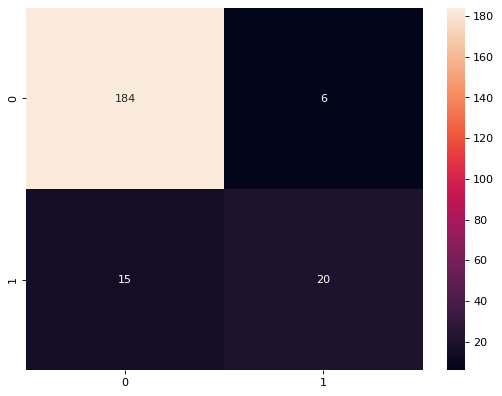

In [72]:
real = swin_baseline['class_t_2']
pred = swin_baseline['class2cl']
matrix = confusion_matrix(real, pred)
matrix.diagonal()/matrix.sum(axis=0)

plt.figure(figsize=(8, 6), dpi=80)
sns.heatmap(matrix, annot=True, fmt='d')

In [82]:
# image_name = '55255632498_28490378125_61766733934_3'
# plt.figure(figsize=(10,10))
# image = Image.open(f'./test_dataset_test/{image_name}.jpg')
# plt.imshow(image)

Посмотрим на снимки класса 2, двух моделей

10942248620_77738287904_92317579456_8


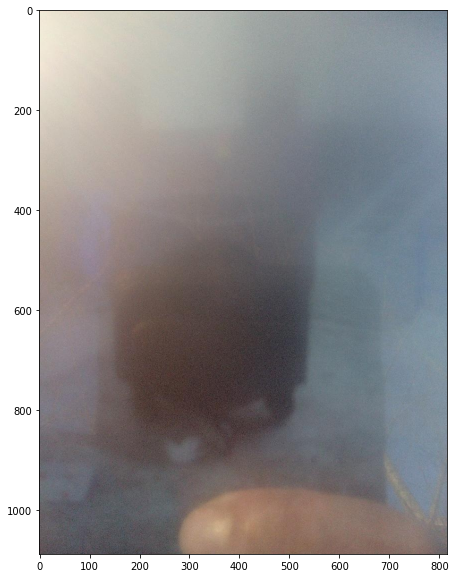

1309706375_26859337355_10248277358_6


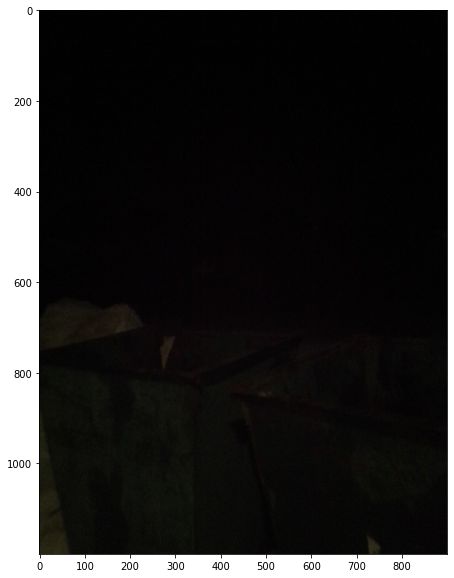

13693932815_79942882458_6879120134_3


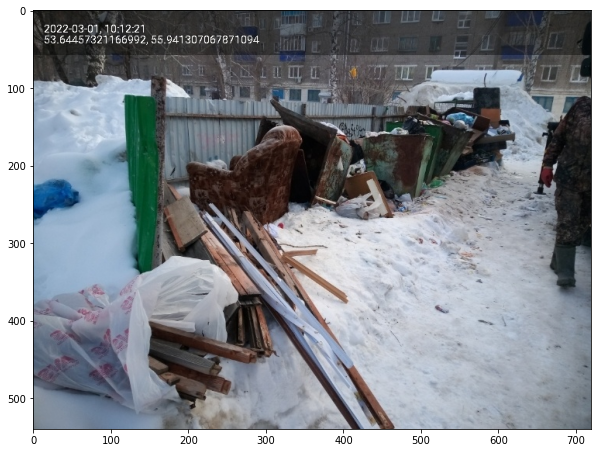

1648698065_17417275877_18649547256_2


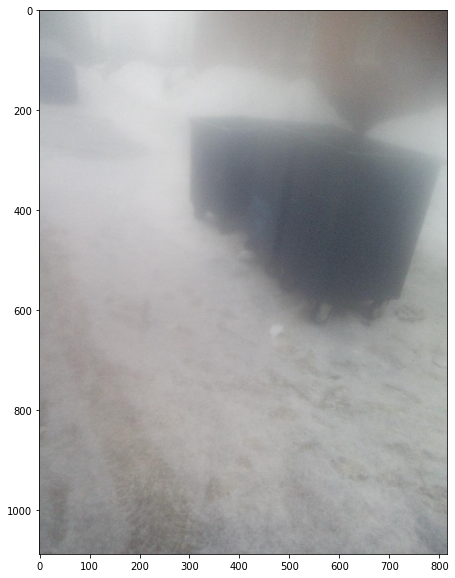

17820331238_48919943775_53688855463_7


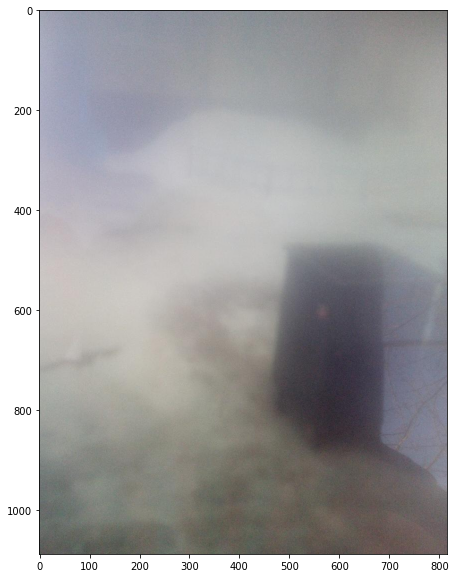

19173102867_61813954986_47769935183_6


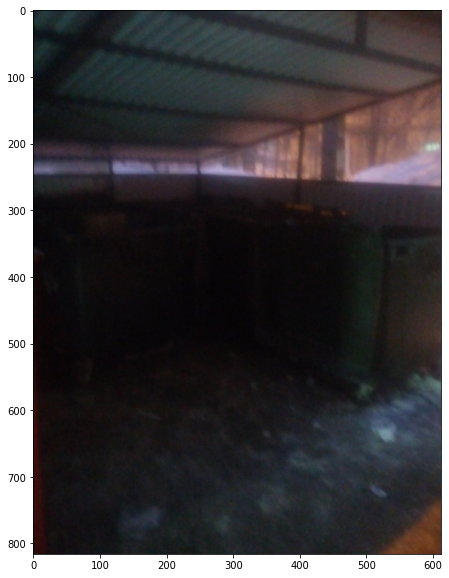

20375412252_17377854913_45007391395_1


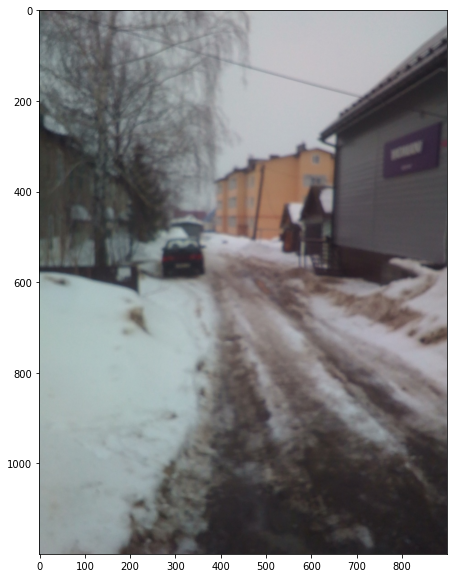

21763461528_61952961247_90581373714_7


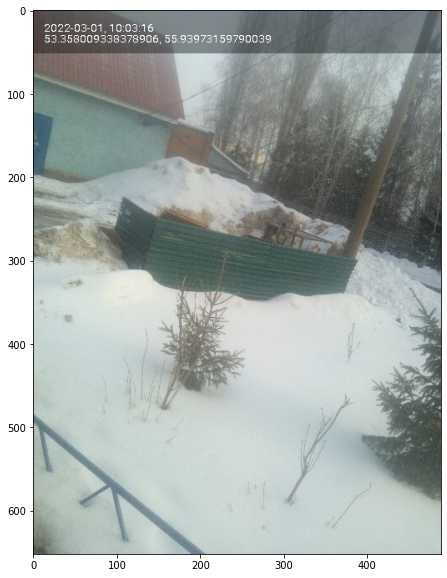

23100616650_76354053691_65752284813_3


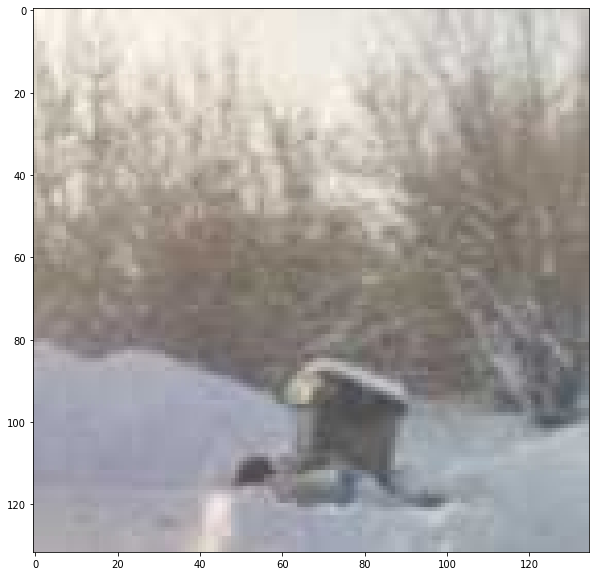

23406810128_92400012225_91189932005_2


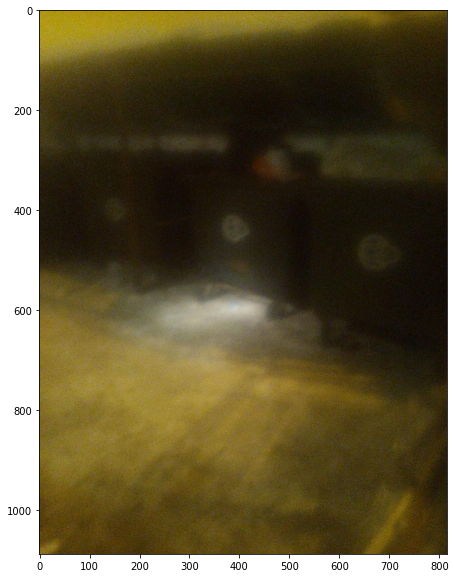

26264642843_91465147462_62719248443_5


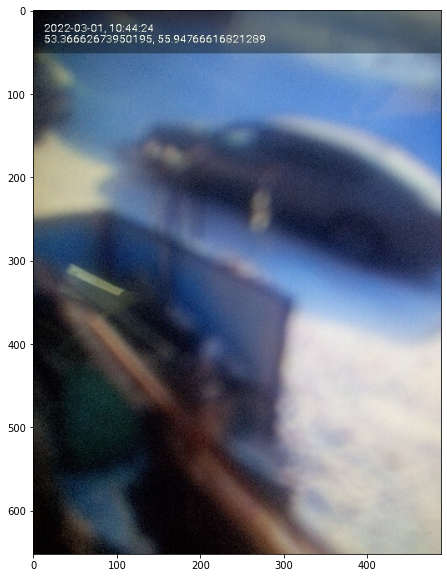

33437125596_39258982967_26350783647_4


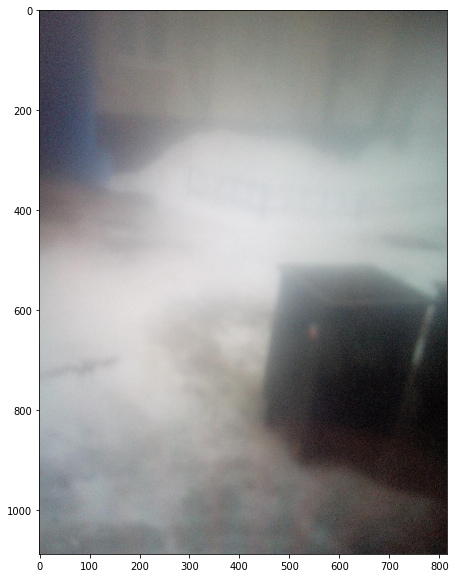

34020749806_42065966214_42113475048_2


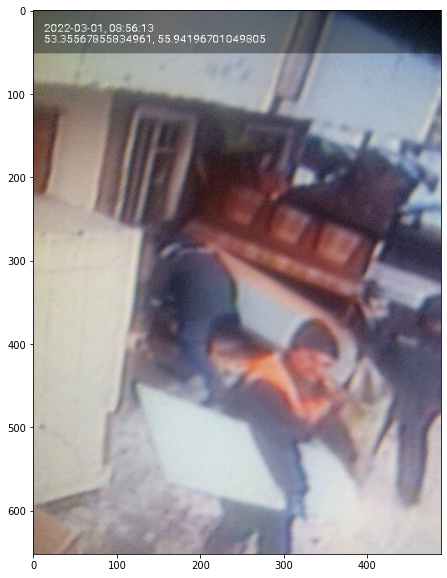

49742175390_41013561135_36437562029_0


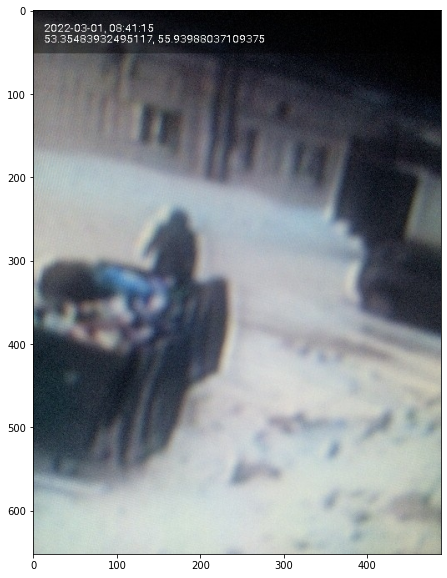

53769398476_24657825276_20812383348_8


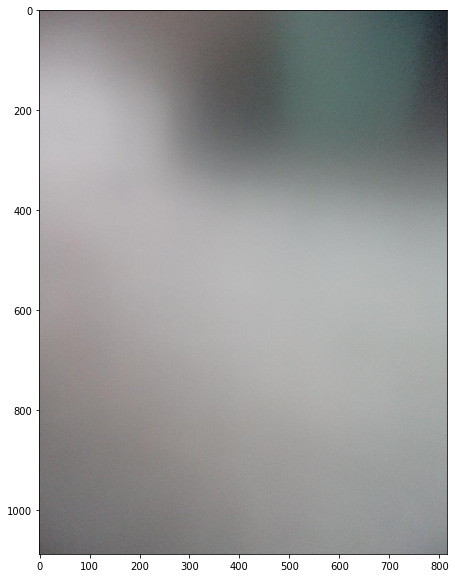

55783240335_76258432858_39377679542_4


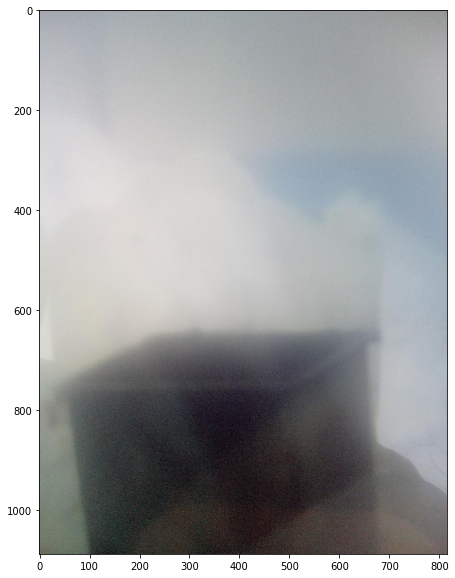

60879177998_15763718934_82574532042_2


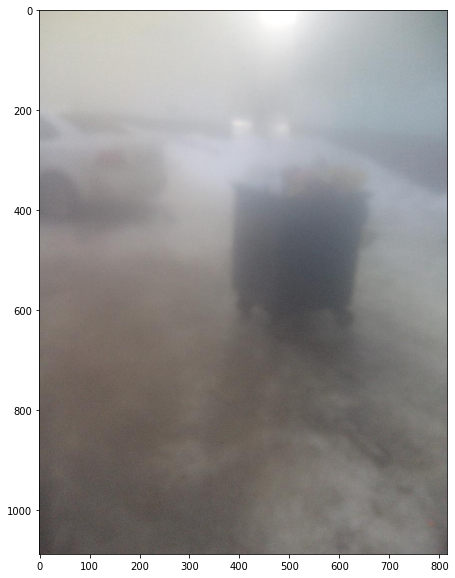

63907678738_56893919786_63552653137_7


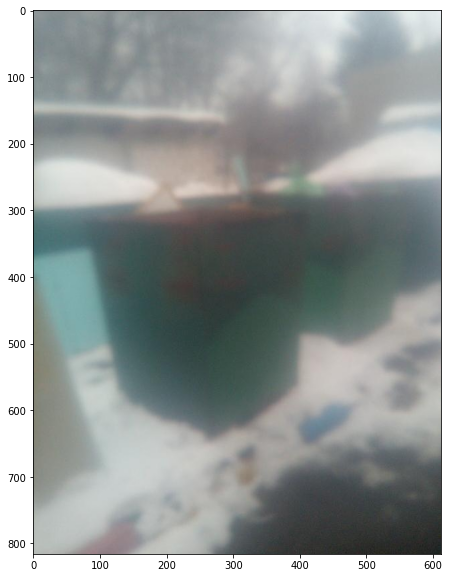

65356595826_46356834781_17361862399_7


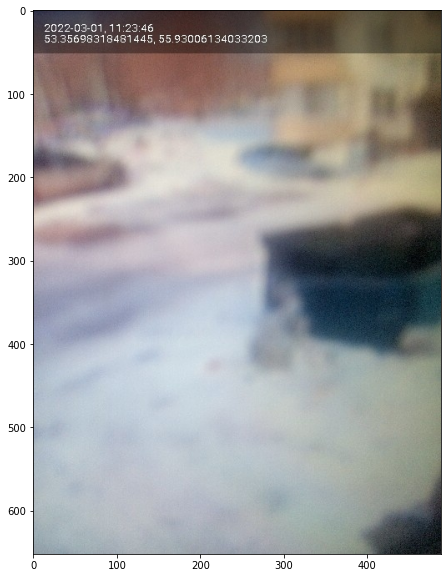

65510266029_20767501970_688436658_1


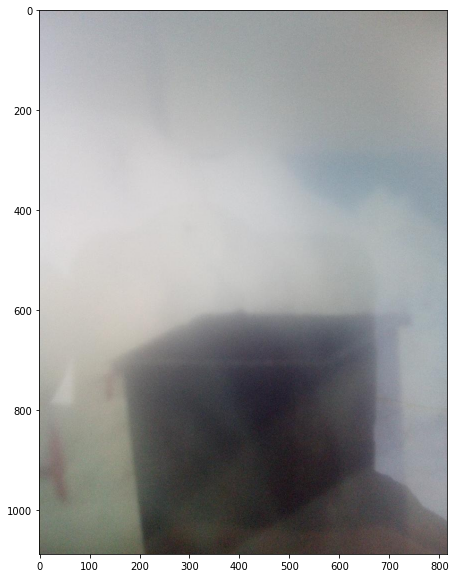

69641418362_27028913412_20450173167_6


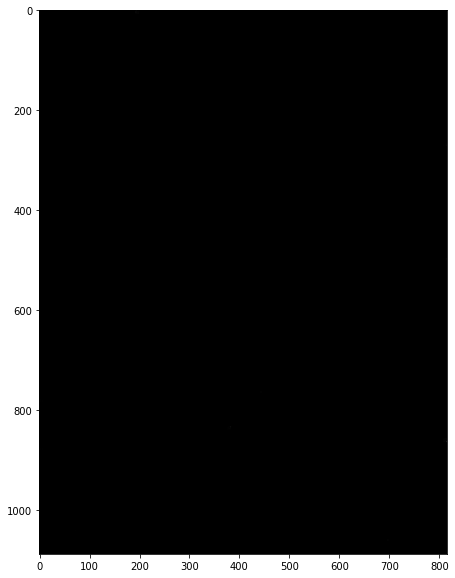

71377579769_34909358388_91771907303_8


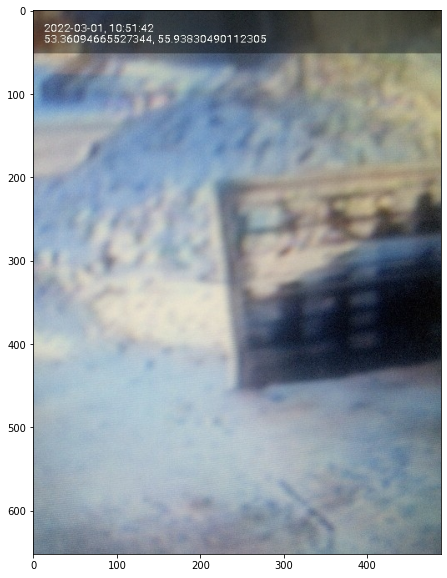

72213326313_85431757350_31010583015_8


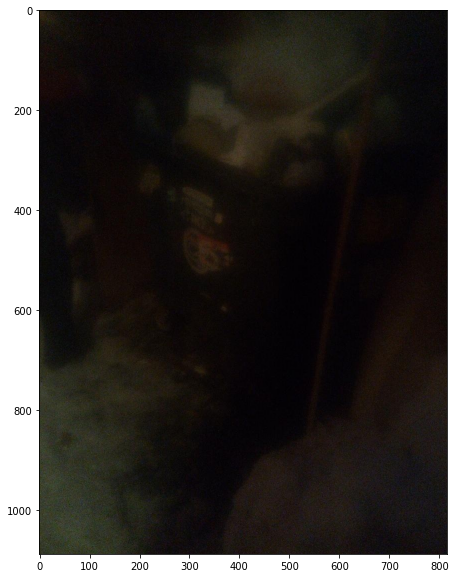

73801481814_25582396594_72202384862_4


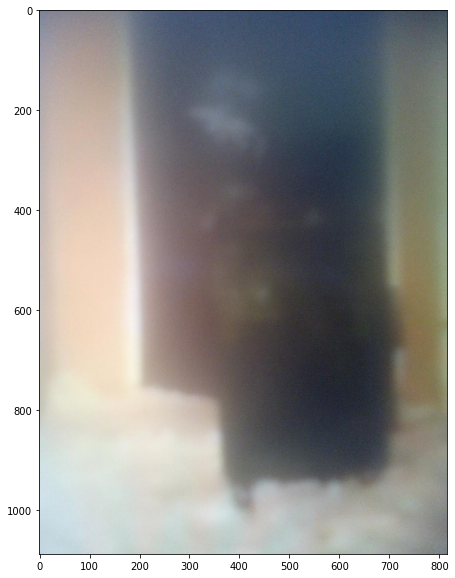

76778506032_87539028907_31034495441_8


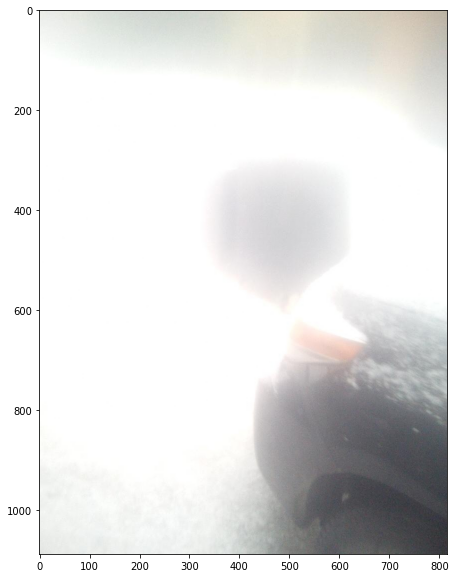

7689511839_47811058882_39977310154_5


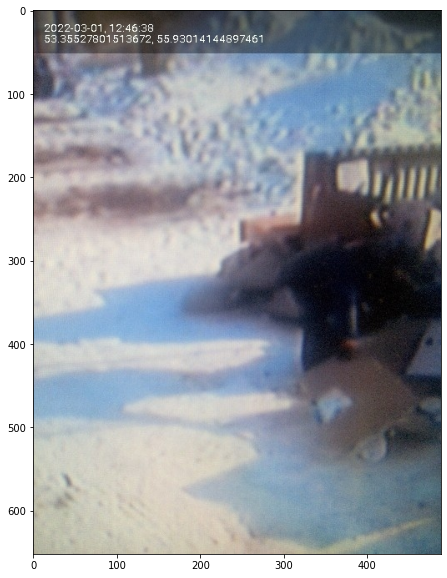

81136076520_35846778793_42009528290_4


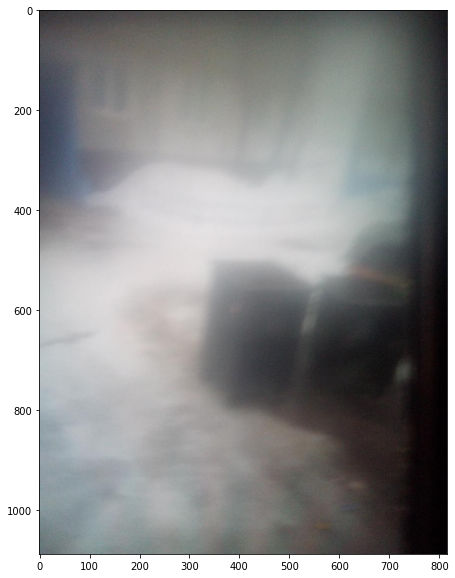

82039697885_82007482498_77760747071_3


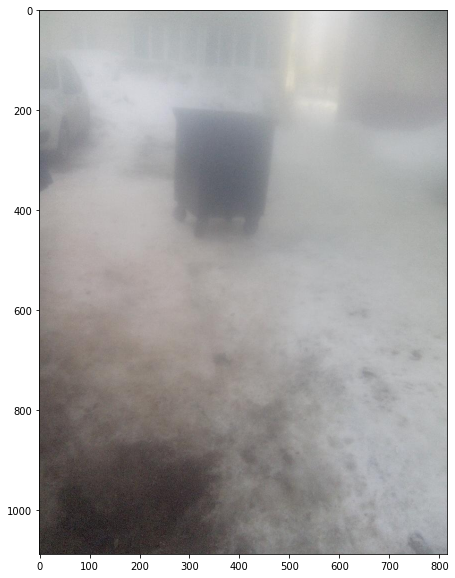

82666345396_46654806289_18773279613_0


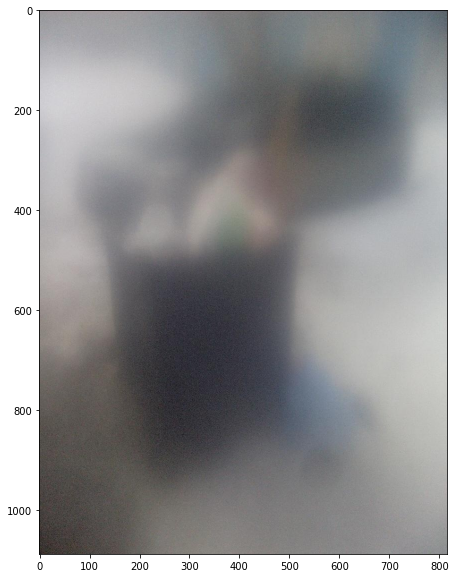

90330162500_72321190089_6199598413_7


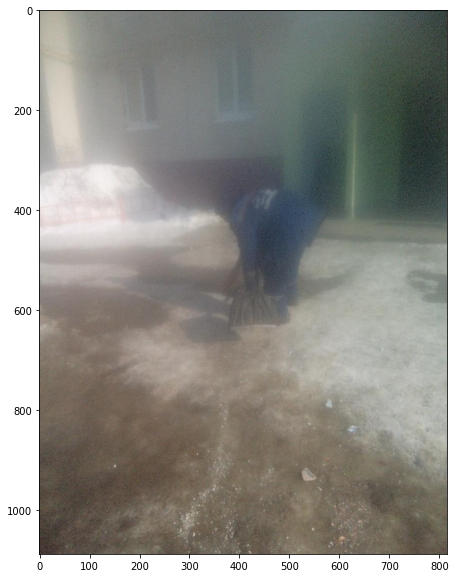

91808068000_92293326341_2876543987_8


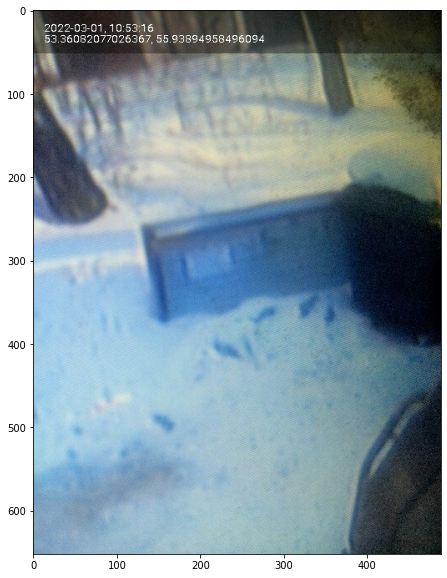

94115163897_12012986067_64878870506_7


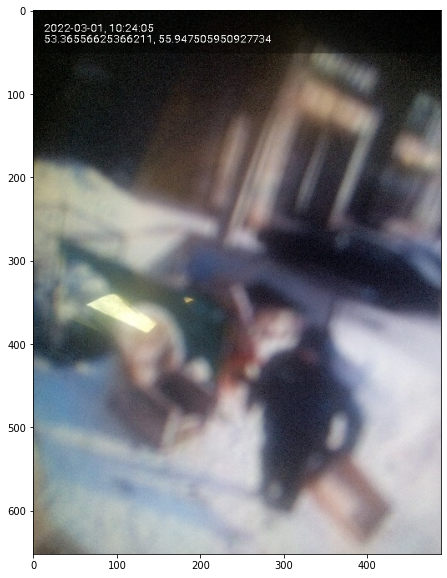

94790217016_17108156014_60668676818_2


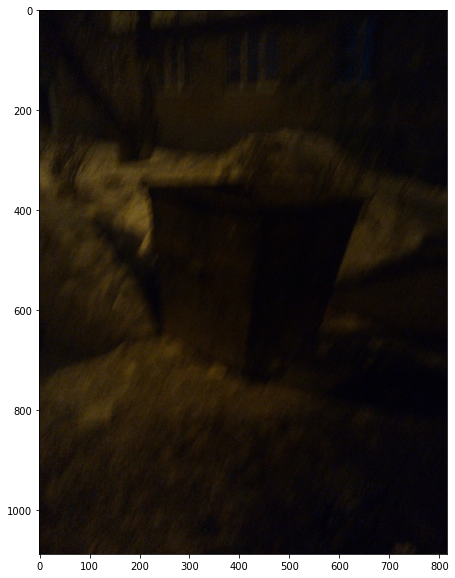

97498216387_79824228102_20906828866_7


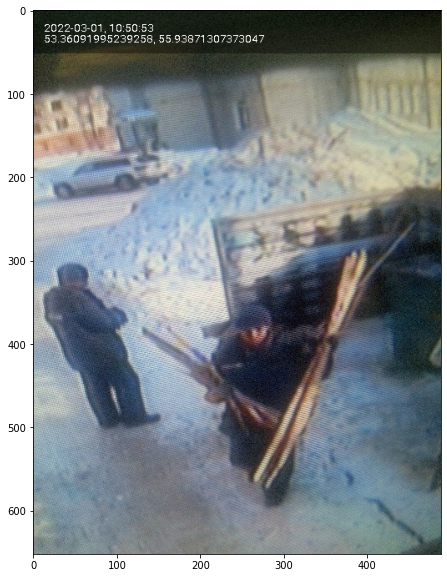

98510645935_77300946780_16775070221_3


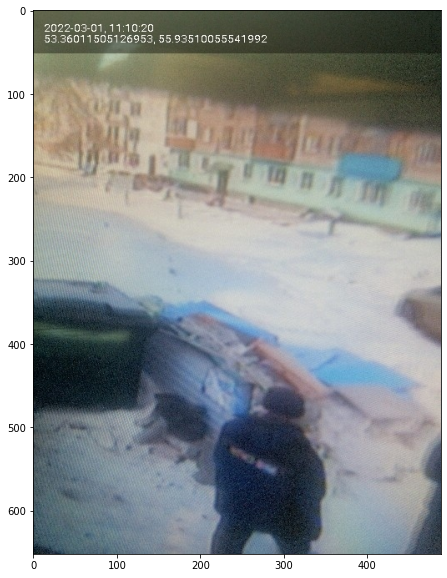

In [76]:
for i, row in swin_baseline[swin_baseline['class_t']== 2].iterrows():
    image = Image.open(f'./test_dataset_test/{row.name}.jpg')
#     image.show()
    print(row.name)
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.show()

22145047546_18900964896_21693707025_7


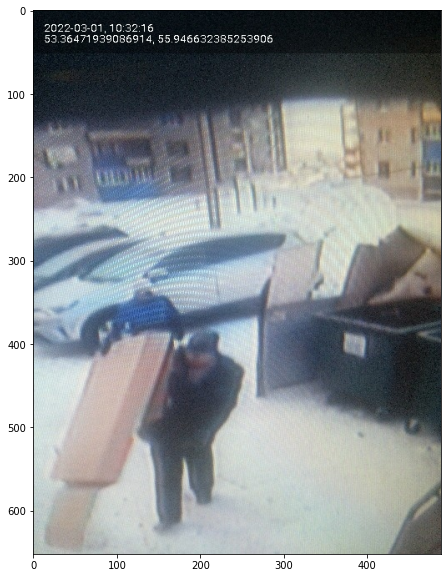

2981096774_68877915067_68099964979_2


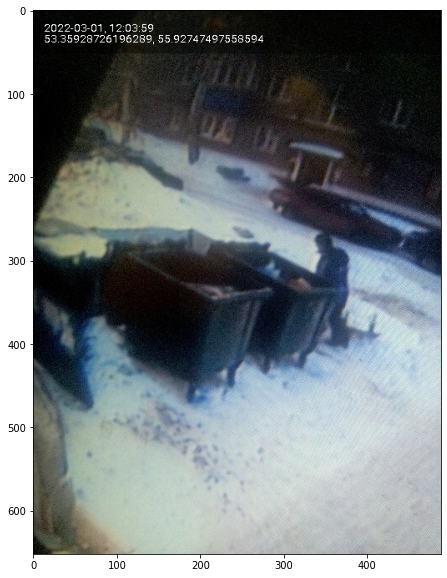

37139743310_60691904652_76502129171_2


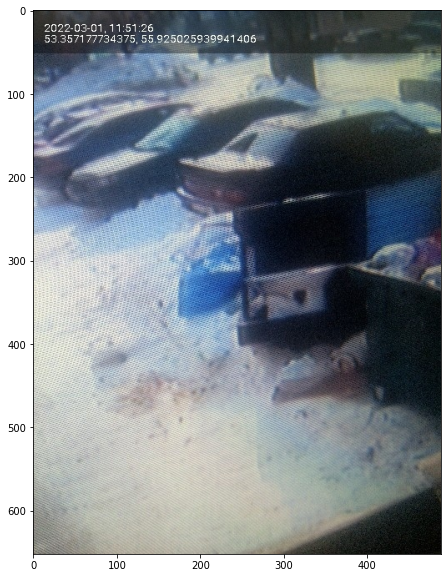

50252372729_38361099992_54369416993_3


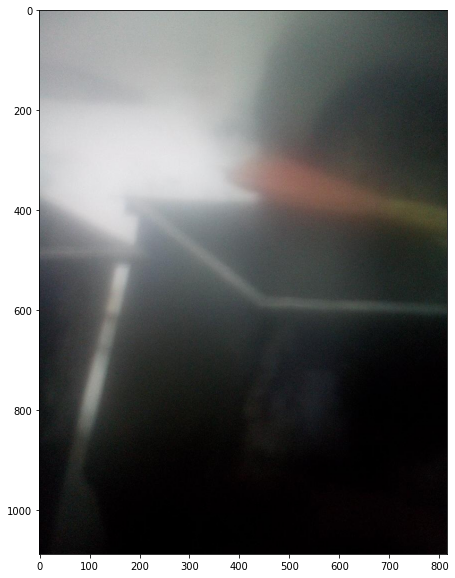

55255632498_28490378125_61766733934_3


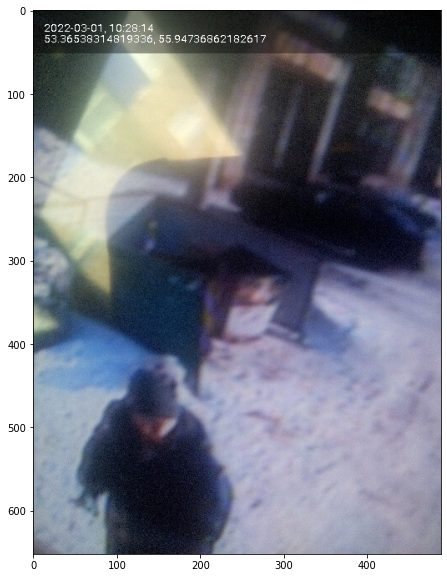

56530562662_69754487625_50001895406_5


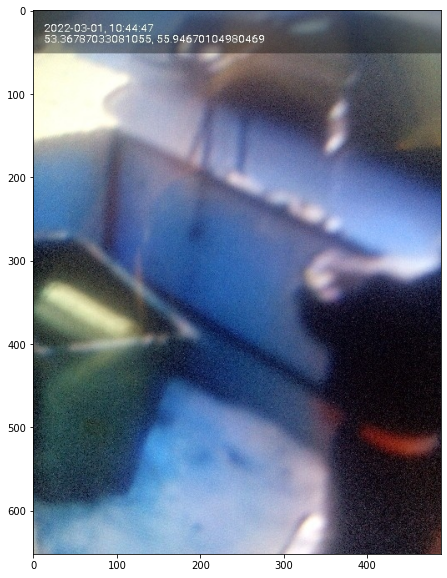

57000052812_89593822963_84814232160_4


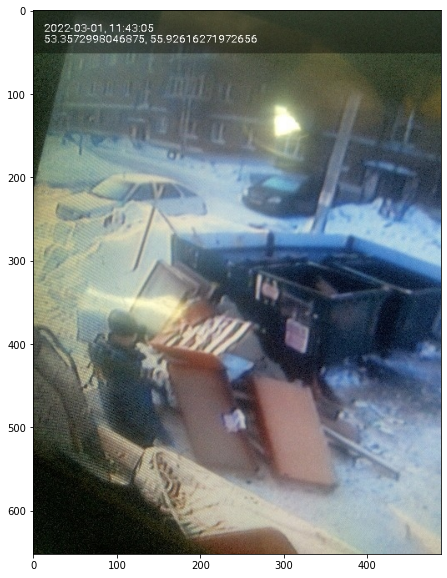

57492173091_20539775008_47950937567_1


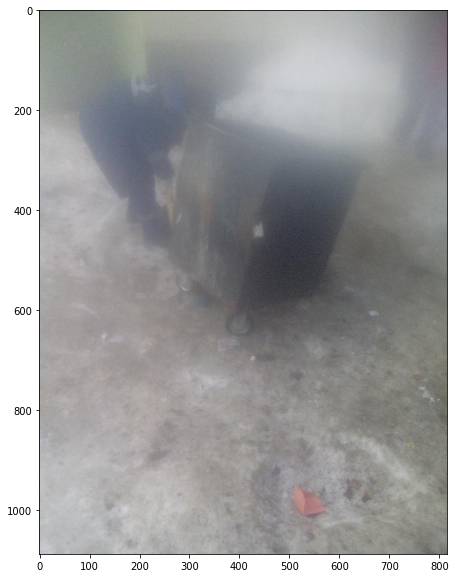

58263336846_68299918516_14168185830_3


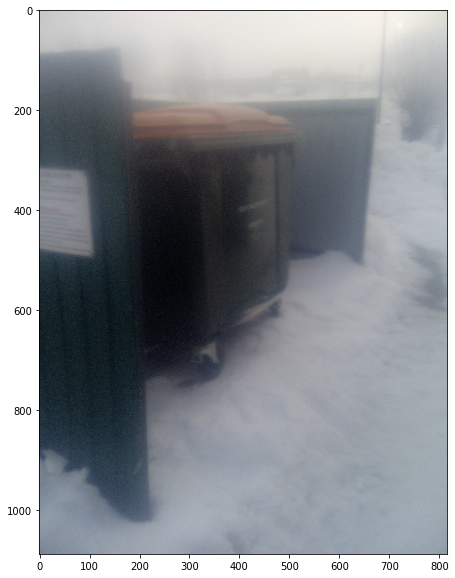

70492442702_21083599816_22777758696_0


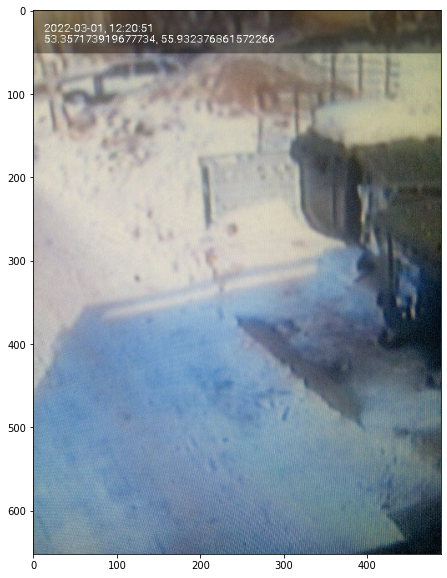

80171655960_54644187390_79272086359_6


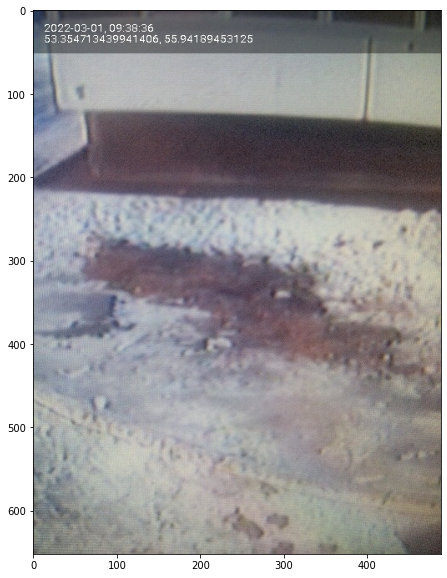

84899424284_62915277763_71428023998_2


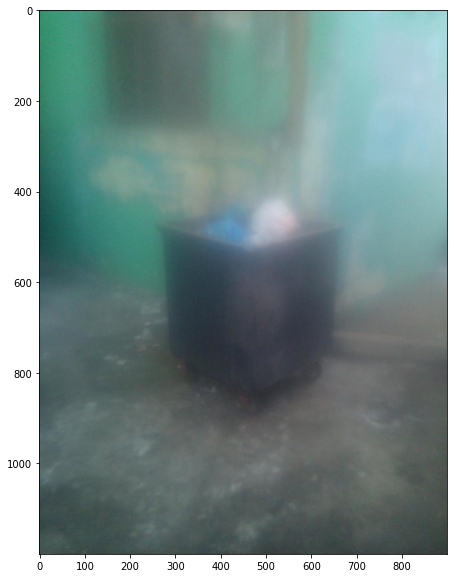

94269895577_67261239447_72224478360_8


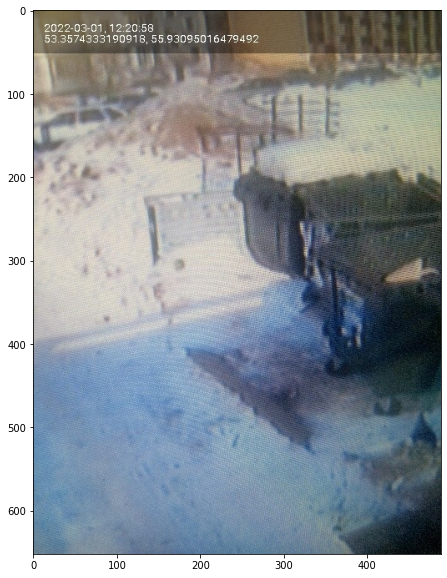

99817980846_27356099293_840981407_7


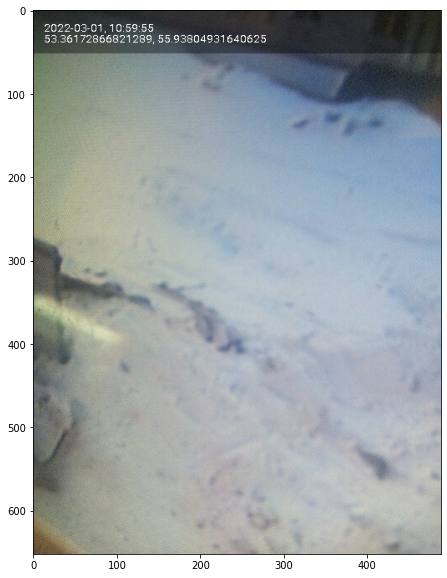

In [85]:
for i, row in swin_baseline[(swin_baseline['class_t'] != 2) & (swin_baseline['class'] == 2)].iterrows():
    image = Image.open(f'./test_dataset_test/{row.name}.jpg')
#     image.show()
    print(row.name)
    plt.figure(figsize=(10,10))
    plt.imshow(image)
    plt.show()

Мержим csv

In [26]:
swin_baseline['class2cl'] = swin_baseline['class2cl'].replace({0:1})

In [27]:
idx_replace = swin_baseline[(swin_baseline['class'] == 2) & (swin_baseline['class2cl'] == 1)].index
swin_baseline.loc[idx_replace,'class'] = swin_baseline.loc[idx_replace]['class2cl']

In [28]:
# idx_replace = swin_baseline[swin_baseline['class2cl']== 2].index
# swin_baseline.loc[idx_replace,'class'] = swin_baseline.loc[idx_replace]['class2cl']

In [34]:
roc_auc_score(label_binarize(swin_baseline['class_t'], classes=[0,1,2]), label_binarize(swin_baseline['class'], classes=[0,1,2]), multi_class='ovo')

NameError: name 'roc_auc_score' is not defined

<AxesSubplot:>

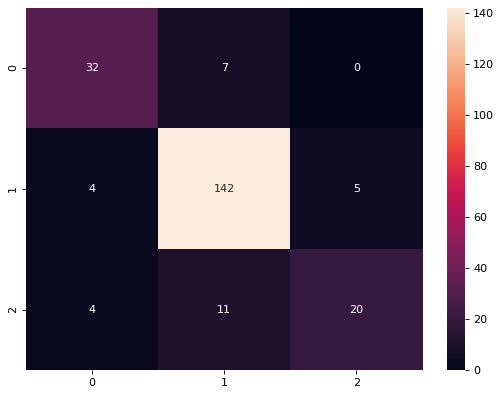

In [33]:
real = swin_baseline['class_t']
pred = swin_baseline['class']
matrix = confusion_matrix(real, pred)
matrix.diagonal()/matrix.sum(axis=0)

plt.figure(figsize=(8, 6), dpi=80)
sns.heatmap(matrix, annot=True, fmt='d')

In [ ]:
swin_baseline = swin_baseline.drop(columns=['class2cl', 'class_t'])
swin_baseline.to_csv('swin_merged_2cl_1.csv')

In [ ]:
# import cv2


# def captch_ex(file_name):
#     img = cv2.imread(file_name)

#     img_final = cv2.imread(file_name)
#     img2gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
#     ret, mask = cv2.threshold(img2gray, 180, 255, cv2.THRESH_BINARY)
#     image_final = cv2.bitwise_and(img2gray, img2gray, mask=mask)
#     ret, new_img = cv2.threshold(image_final, 180, 255, cv2.THRESH_BINARY)  # for black text , cv.THRESH_BINARY_INV
#     '''
#             line  8 to 12  : Remove noisy portion 
#     '''
#     kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (3,
#                                                          3))  # to manipulate the orientation of dilution , large x means horizonatally dilating  more, large y means vertically dilating more
#     dilated = cv2.dilate(new_img, kernel, iterations=9)  # dilate , more the iteration more the dilation

#     # for cv2.x.x

# #     _, contours, hierarchy = cv2.findContours(dilated, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)  # findContours returns 3 variables for getting contours

#     # for cv3.x.x comment above line and uncomment line below

# #     image, contours, hierarchy = cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)
#     contours, hierarchy = cv2.findContours(dilated,cv2.RETR_EXTERNAL,cv2.CHAIN_APPROX_NONE)


#     for contour in contours:
#         # get rectangle bounding contour
#         [x, y, w, h] = cv2.boundingRect(contour)

#         # Don't plot small false positives that aren't text
#         if w < 35 and h < 35:
#             continue

#         # draw rectangle around contour on original image
#         cv2.rectangle(img, (x, y), (x + w, y + h), (255, 0, 255), 2)

#         '''
#         #you can crop image and send to OCR  , false detected will return no text :)
#         cropped = img_final[y :y +  h , x : x + w]

#         s = file_name + '/crop_' + str(index) + '.jpg' 
#         cv2.imwrite(s , cropped)
#         index = index + 1

#         '''
#     # write original image with added contours to disk
#     cv2.imshow('captcha_result', img)
#     cv2.waitKey()


# file_name = f'./test_dataset_test/{image_name}.jpg'
# captch_ex(file_name)